In [1]:
import torch
import torch.nn.functional as F
from matplotlib import pyplot as plt
from matplotlib import animation
import numpy as np

In [2]:
forecast_folder = "./results/full-dataset/forecasts/stconvs2s-r/"

In [3]:
target = torch.load(forecast_folder + 'shallow_water_step20_4_20201221-062618_target.pt')
output = torch.load(forecast_folder + 'shallow_water_step20_4_20201221-062618_output.pt')

In [4]:
np_target = target.cpu().numpy()
np_output = output.cpu().numpy()

# Seq 5, steps 10 -> Seq 20, steps 10

Distance between each step: 15 min (total: 5h)


In [5]:
%matplotlib auto

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.title.set_text('Target')
ax1.title.set_fontsize(40)
ax2.title.set_text('Output')
ax2.title.set_fontsize(40)
data_target = np_target[0,0,0,:,:]
data_output = np_output[0,0,0,:,:]
im1 = ax1.imshow(data_target)
im2 = ax2.imshow(data_output)

def init():
    im1.set_data(np_target[0,0,0,:,:])
    im2.set_data(np_output[0,0,0,:,:])

def animate(i):
    im1.set_data(np_target[0,0,i,:,:])
    im2.set_data(np_output[0,0,i,:,:])
    
frames = np_target.shape[2]

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=frames, repeat = True)

from IPython.display import HTML
HTML(anim.to_jshtml())

#anim.to_html5_video()

Using matplotlib backend: agg


In [6]:
fig2, (ax21, ax22) = plt.subplots(1, 2, figsize=(20,10))
ax21.title.set_text('Target')
ax21.title.set_fontsize(40)
ax22.title.set_text('Output')
ax22.title.set_fontsize(40)
data_target = np_target[0,0,0,:,:]
data_output = np_output[0,0,0,:,:]
im21 = ax21.imshow(data_target)
im22 = ax22.imshow(data_output)

def init():
    im21.set_data(np.zeros((40, 40)))
    im22.set_data(np.zeros((40, 40)))

def animate(i):
    im21.set_data(np_target[i*5,0,19,:,:])
    im22.set_data(np_output[i*5,0,19,:,:])
    
frames = 200

anim2 = animation.FuncAnimation(fig2, animate, init_func=init, frames=frames, repeat = True)

from IPython.display import HTML
HTML(anim2.to_jshtml())


In [7]:
class RMSELoss(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.mse = torch.nn.MSELoss()
        
    def forward(self,yhat,y):
        return torch.sqrt(self.mse(yhat,y) + 1e-6 )

In [8]:
rmse_loss, mae_loss, x = [], [], []

for i in range(target.size()[2]):
    yhat, y = output[:,:,i,:,:], target[:,:,i,:,:]
    criterium = RMSELoss()
    rmse_loss.append(criterium(yhat, y))
    mae_loss.append(F.l1_loss(yhat, y))
    x.append(i+1)

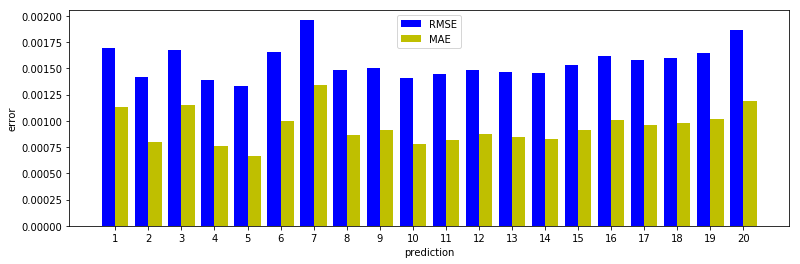

In [9]:
%matplotlib inline
width = 0.4
fig_bar = plt.figure(figsize=(10,3))
ax = fig_bar.add_axes([0,0,1,1])
ax.bar(np.arange(1,len(x)+1)-width/2, rmse_loss, width=0.4, color='b', label='RMSE')
ax.bar(np.arange(1,len(x)+1)+width/2, mae_loss, width=0.4, color='y', label='MAE')
ax.set_xticks(x)
plt.ylabel('error')
plt.xlabel('prediction')
plt.legend(loc="upper center")
plt.show()

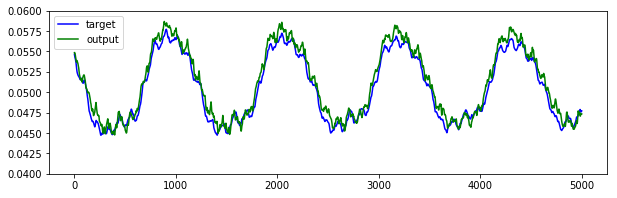

In [10]:
length = 5000

plt.figure(figsize=(10,3))
plt.plot(np.arange(1,length+1), np_target[:length,0,7,30,10], "-b", label="target")
plt.plot(np.arange(1,length+1), np_output[:length,0,7,30,10], "-g", label="output")
plt.legend(loc="upper left")
plt.ylim(0.04, 0.06)
plt.show()

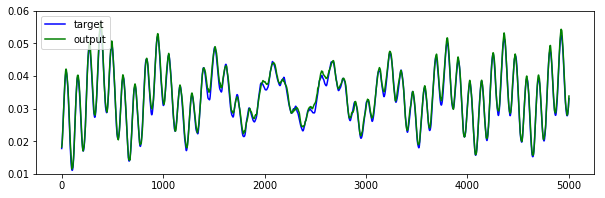

In [11]:
length = 5000

plt.figure(figsize=(10,3))
plt.plot(np.arange(1,length+1), np_target[:length,0,7,20,20], "-b", label="target")
plt.plot(np.arange(1,length+1), np_output[:length,0,7,20,20], "-g", label="output")
plt.legend(loc="upper left")
plt.ylim(0.01, 0.06)
plt.show()